<a href="https://colab.research.google.com/github/trhgquan/OCR_chu_nom/blob/main/train_detection_with_centernet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# About
Based on [CenterNet -Keypoint Detector-](https://www.kaggle.com/kmat2019/centernet-keypoint-detector/)

Phần này có sử dụng model classify đã train trong `train_recognition.ipynb`, based on [Kuzushiji Recognition just like Digit Recognition](https://www.kaggle.com/basu369victor/kuzushiji-recognition-just-like-digit-recognition/notebook)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing libraries

In [ ]:
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
import random
import tensorflow as tf
import cv2
import glob
import os

from matplotlib.axes import Axes
from PIL import Image, ImageDraw, ImageFont
from pandas.io.json import json_normalize
from sklearn.utils import shuffle
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout, Conv2D, Conv2DTranspose, BatchNormalization, Activation, AveragePooling2D, GlobalAveragePooling2D, Input, Concatenate, MaxPool2D, MaxPooling2D, Flatten, Add, UpSampling2D, LeakyReLU, ZeroPadding2D
from keras.models import Model, load_model
from sklearn.metrics import mean_squared_error
from keras import backend as K
from keras.losses import binary_crossentropy, mean_squared_error
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm

In [ ]:
# Using gpu
tf.test.gpu_device_name()

'/device:GPU:0'

# Defining input & loading data

In [ ]:
# File path
FONT_PATH = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/NotoSansCJKjp-Regular.otf'
train_path = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/train_1.csv'
# train_path = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/train.csv'
train_images = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/data_real/img/'
test_path = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/test_1.csv'
translation_csv_path = '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/unicode_translate.csv'

In [ ]:
# Read train.csv to get training data.
df_train = pd.read_csv(train_path)

df_train = df_train.dropna(axis = 0, how = 'any')
df_train = df_train.reset_index(drop = True)

# Creating dictionary of characters
annotation_list_train = []
category_names = set()

for i in range(len(df_train)):
    ann = np.array(df_train.loc[i, 'labels'][:-1].split(' ')).reshape(-1, 5)
    category_names = category_names.union({i for i in ann[:, 0]})

category_names = sorted(category_names)
dict_cat = {list(category_names)[j] : str(j) for j in range(len(category_names))}
inv_dict_cat = {str(j) : list(category_names)[j] for j in range(len(category_names))}

for i in range(len(df_train)):
    ann = np.array(df_train.loc[i, 'labels'][:-1].split(' ')).reshape(-1, 5)

    for j, category_name in enumerate(ann[:, 0]):
        ann[j, 0] = int(dict_cat[category_name])
        ann[j, 1] = int(float(ann[j, 1]))
        ann[j, 2] = int(float(ann[j, 2]))
        ann[j, 3] = int(float(ann[j, 3]))
        ann[j, 4] = int(float(ann[j, 4]))

    ann = ann.astype('int32')

    ann[:, 3] -= ann[:, 1]
    ann[:, 4] -= ann[:, 2]

    ann[:, 1] += ann[:, 3] // 2
    ann[:, 2] += ann[:, 4] // 2

    # Finding the center of ann

    annotation_list_train.append(['{}{}'.format(
        train_images,
        df_train.loc[i, 'image_id']
    ), ann])

sample image


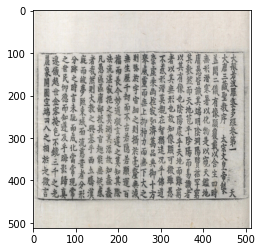

In [ ]:
print("sample image")
input_width,input_height=512, 512
img = np.asarray(Image.open(annotation_list_train[0][0]).resize((input_width,input_height)).convert('RGB'))
plt.imshow(img)
plt.show()

In [ ]:
print(annotation_list_train[0])

['/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/data_real/img/0001_001_26_02.jpg', array([[1505,   35,  738,   42,   36],
       [4527,   32,  783,   56,   38],
       [4562,   31,  818,   42,   36],
       ...,
       [1644, 2210, 1161,   76,   66],
       [1704, 2211, 1241,   94,   86],
       [4310, 2204, 1321,   84,   66]], dtype=int32)]


# Preprocessing

Khảo sát kích thước của dataset: số chữ / ảnh

In [ ]:
aspect_ratio_pic_all = []
average_letter_size_all = []
train_input_for_size_estimate = []
resize_dir = '/content/resized'

if not os.path.exists(resize_dir):
    os.mkdir(resize_dir)

for i in tqdm(range(len(annotation_list_train))):
    with Image.open(annotation_list_train[i][0]) as f:
        w, h = f.size
        area = w * h
        aspect_ratio_pic = h / w
        aspect_ratio_pic_all.append(aspect_ratio_pic)

        letter_size = annotation_list_train[i][1][:, 3] * annotation_list_train[i][1][:, 4] 
        letter_size_ratio = letter_size / area

        average_letter_size = np.mean(letter_size_ratio)
        average_letter_size_all.append(average_letter_size)
        train_input_for_size_estimate.append([annotation_list_train[i][0], np.log(average_letter_size)])

        # print('Done processing', annotation_list_train[i][0])

 33%|███▎      | 728/2199 [05:24<10:55,  2.24it/s]


KeyboardInterrupt: ignored

In [ ]:
# Dump to json file for later reuse
with open('train_input_for_size_estimate.txt', 'w+') as f:
    json.dump(train_input_for_size_estimate, f)

with open('aspect_ratio_pic_all.txt', 'w+') as f:
    json.dump(aspect_ratio_pic_all, f)

with open('average_letter_size_all.txt', 'w+') as f:
    json.dump(average_letter_size_all, f)

NameError: ignored

In [ ]:
!cp '/content/train_input_for_size_estimate.txt' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/train_input_for_size_estimate.txt'
!cp '/content/aspect_ratio_pic_all.txt' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/aspect_ratio_pic_all.txt'
!cp '/content/average_letter_size_all.txt' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/average_letter_size_all.txt'

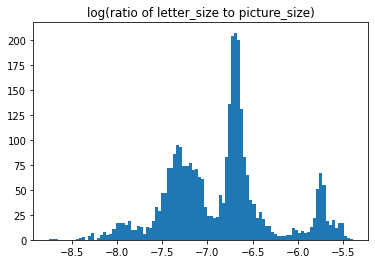

In [ ]:
# Load from json
with open('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/train_input_for_size_estimate.txt', 'r+') as f:
    train_input_for_size_estimate = json.load(f)

with open('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/aspect_ratio_pic_all.txt', 'r+') as f:
    aspect_ratio_pic_all = json.load(f)

with open('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/average_letter_size_all.txt', 'r+') as f:
    average_letter_size_all = json.load(f)


plt.hist(np.log(average_letter_size_all), bins = 100)
plt.title('log(ratio of letter_size to picture_size)', loc = 'center', fontsize = 12)
plt.show()

## Create a CNN model
- Input: Image (512 x 512 x 3)
- Output: Ratio of letter_size to picture_size

Mục đích của bước này là xây dựng một model đánh giá kích thước của chữ so với ảnh.

Chữ càng nhỏ thì ảnh phải chia thành nhiều phần để dễ nhận dạng trên từng phần đó.

In [ ]:
category_n = 1
input_width, input_height = 512, 512

def datagen_sizecheck_model(file_list, batch_size, size_detection_mode = True, is_train = True, random_crop = True):
    x, y = [], []
    count = 0

    while True:
        for i in range(len(file_list)):
            crop_ratio = np.random.uniform(0.7, 1) if random_crop else 1
            with Image.open(file_list[i][0]) as f:
                if random_crop and is_train:
                    pic_width, pic_height = f.size
                    f = np.asarray(f.convert('RGB'), dtype = np.uint8)
                    
                    top_offset = np.random.randint(0, pic_height - int(crop_ratio * pic_height))
                    left_offset = np.random.randint(0, pic_width - int(crop_ratio * pic_width))
                    bottom_offset = top_offset + int(crop_ratio * pic_height)
                    right_offset = left_offset + int(crop_ratio * pic_width)

                    f = cv2.resize(f[top_offset:bottom_offset, left_offset:right_offset, :], (input_height, input_width))
                else:
                    f = f.resize((input_width, input_height))
                    f = np.asarray(f.convert('RGB'), dtype = np.uint8)
                
                x.append(f)

            if random_crop and is_train:
                y.append(file_list[i][1] - np.log(crop_ratio))
            else:
                y.append(file_list[i][1])
            
            count += 1
            
            if count == batch_size:
                x = np.array(x, dtype = np.float32)
                y = np.array(y, dtype = np.float32)
            
                inputs = x / 255
                targets = y
                
                # Reset variables
                x, y = [], []
                count = 0

                yield inputs, targets

def aggregation_block(x_shallow, x_deep, deep_ch, out_ch):
    x_deep = Conv2DTranspose(
        deep_ch, 
        kernel_size = 2, strides = 2, 
        padding = 'same', use_bias = False)(x_deep)
    x_deep = BatchNormalization()(x_deep)
    x_deep = LeakyReLU(alpha = 0.1)(x_deep)
    x = Concatenate()([x_shallow, x_deep])
    x = Conv2D(out_ch, kernel_size = 1, strides = 1, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha = 0.1)(x)
    return x

def cbr(x, out_layer, kernel, stride):
    x = Conv2D(out_layer, kernel_size = kernel, strides = stride, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha = 0.1)(x)
    return x

def resblock(x_in, layer_n):
    x = cbr(x_in, layer_n, 3, 1)
    x = cbr(x, layer_n, 3, 1)
    x = Add()([x, x_in])
    return x

def create_model(input_shape, size_detection_mode = True, aggregation = True):
    input_layer = Input(input_shape)

    # Resized input
    input_layer_1 = AveragePooling2D(2)(input_layer)
    input_layer_2 = AveragePooling2D(2)(input_layer_1)

    # Encoder

    # Transform 512 to 256
    x0 = cbr(input_layer, 16, 3, 2)
    concat1 = Concatenate()([x0, input_layer_1])

    # Transform from 256 to 128
    x1 = cbr(concat1, 32, 3, 2)
    concat2 = Concatenate()([x1, input_layer_2])

    # Transfrom from 128 to 64
    x2 = cbr(concat2, 64, 3, 2)
    x = cbr(x2, 64, 3, 1)
    x = resblock(x, 64)
    x = resblock(x, 64)

    # Transform from 64 to 32
    x3 = cbr(x, 128, 3, 2)
    x = cbr(x3, 128, 3, 1)
    x = resblock(x, 128)
    x = resblock(x, 128)
    x = resblock(x, 128)

    # Transform from 32 to 16
    x4 = cbr(x, 256, 3, 2)
    x = cbr(x4, 256, 3, 1)
    x = resblock(x, 256)
    x = resblock(x, 256)
    x = resblock(x, 256)
    x = resblock(x, 256)
    x = resblock(x, 256)

    # Transform from 16 to 8
    x5 = cbr(x, 512, 3, 2)
    x = cbr(x5, 512, 3, 1)
    x = resblock(x, 512)
    x = resblock(x, 512)
    x = resblock(x, 512)

    if size_detection_mode:
        x = GlobalAveragePooling2D()(x)
        x = Dropout(0.2)(x)
        out = Dense(1, activation = 'linear')(x)
    
    else:
        # Centernet mode
        x1 = cbr(x1, output_layer_n, 1, 1)
        x1 = aggregation_block(x1, x2, output_layer_n, output_layer_n)
        
        x2 = cbr(x2, output_layer_n, 1, 1)
        x2 = aggregation_block(x2, x3, output_layer_n, output_layer_n)
        x1 = aggregation_block(x1, x2, output_layer_n, output_layer_n)
        
        x3 = cbr(x3, output_layer_n, 1, 1)
        x3 = aggregation_block(x3, x4, output_layer_n, output_layer_n)
        x2 = aggregation_block(x2, x3, output_layer_n, output_layer_n)
        x1 = aggregation_block(x1, x2, output_layer_n, output_layer_n)

        x4 = cbr(x4, output_layer_n, 1, 1)
        x = cbr(x, output_layer_n, 1, 1)
        x = UpSampling2D(size = (2, 2))(x)

        x = Concatenate()([x, x4])
        x = cbr(x, output_layer_n, 3, 1)
        x = UpSampling2D(size = (2, 2))(x)

        x = Concatenate()([x, x3])
        x = cbr(x, output_layer_n, 3, 1)
        x = UpSampling2D(size = (2, 2))(x)

        x = Concatenate()([x, x2])
        x = cbr(x, output_layer_n, 3, 1)
        x = UpSampling2D(size = (2, 2))(x)

        x = Concatenate()([x, x1])
        x = Conv2D(output_layer_n, kernel_size = 3, strides = 1, padding = 'same')(x)

        out = Activation('sigmoid')(x)

    model = Model(input_layer, out)

    return model

def model_fit_sizecheck_model(model, train_list, cv_list, n_epoch, batch_size = 32):
    train_datagen = datagen_sizecheck_model(train_list, batch_size, is_train = True, random_crop = True)
    val_datagen = datagen_sizecheck_model(cv_list, batch_size, is_train = False, random_crop = False)

    hist = model.fit(
        train_datagen,
        validation_data = val_datagen,
        steps_per_epoch = len(train_list) // batch_size,
        epochs = n_epoch,
        validation_steps = len(cv_list) // batch_size,
        batch_size = batch_size,
        callbacks = [lr_schedule, model_checkpoint],
        shuffle = True,
        verbose = 1
    )
    return hist


In [ ]:
K.clear_session()
model = create_model(input_shape = (input_height, input_width, 3), size_detection_mode = True)

# Early stopping
# early_stopping = EarlyStopping(monitor = 'val_loss', min_delta = 0, patience = 0, verbose = 1)

# # Model checkpoint
# weights_dir = '/content/model_1/'
# if not os.path.exists(weights_dir): os.mkdir(weights_dir)

# model_checkpoint = ModelCheckpoint(weights_dir + 'val_loss{val_loss:.3f}.hdf5', monitor = 'val_loss', verbose = 1, save_best_only = True, save_weights_only = True, period = 1)

# # Reduce learning rate
# reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.5, patience = 10, verbose = 1)

def lrs(epoch):
    lr = 0.0005
    if epoch > 10:
        lr = 0.0001
    return lr

lr_schedule = LearningRateScheduler(lrs)
model_checkpoint = ModelCheckpoint(
    'final_weights_step1.hdf5', 
    monitor = 'val_loss',
    verbose = 1, save_best_only = True, save_weights_only = True, 
    period  = 1)

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
# Training preprocessing model
train_list, cv_list = train_test_split(train_input_for_size_estimate, random_state = 111, test_size = 0.2)

def train_preprocessing_model():
    learning_rate = 0.0005
    n_epoch = 12
    batch_size = 32

    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # mean_squared_error = tf.keras.losses.mean_squared_error
    # model.compile(loss = mean_squared_error, optimizer = optimizer)
    model.compile(loss = mean_squared_error, optimizer = Adam(learning_rate = learning_rate))
    hist = model_fit_sizecheck_model(model, train_list, cv_list, n_epoch, batch_size)

    model.save_weights('final_weights_step1.h5')

# TODO: since step1 model is a checkpoint, consider re-train if there are times left.
# train_preprocessing_model()

In [ ]:
# Save model to drive

!cp 'final_weights_step1.hdf5' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step1.hdf5'

In [ ]:
# Load saved model.

model.load_weights('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step1.hdf5')

640/640 [==============================] - 230s 360ms/step


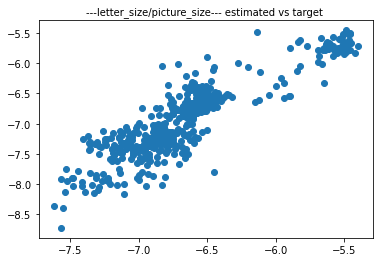

In [ ]:
# predict = model.predict_generator(datagen_sizecheck_model(cv_list, batch_size, is_train = False, random_crop = False), steps = len(cv_list) // batch_size)
batch_size = 12

predict = model.predict(
    datagen_sizecheck_model(cv_list, batch_size, is_train = False, random_crop = False), 
    steps = len(cv_list) // batch_size,
    verbose = 1)
target = [cv[1] for cv in cv_list]

plt.scatter(predict, target[:len(predict)])
plt.title('---letter_size/picture_size--- estimated vs target ',loc='center',fontsize=10)
plt.show()

## Determine split number based on predicted size.
Vấn đề đặt ra là nếu tạo heatmap trên ảnh ban đầu sẽ *dễ* miss các chữ nhỏ. Chia ảnh ra thành nhiều phần dựa trên kích thước đã predict bên trên sẽ giúp nhận dạng các chữ này dễ hơn.

In [ ]:
batch_size = 1
predict_train = model.predict(
    datagen_sizecheck_model(
        train_input_for_size_estimate, batch_size, 
        is_train = False, random_crop = False),
    steps = len(train_input_for_size_estimate) // batch_size,
    verbose = 1
)

3199/3199 [==============================] - 1256s 392ms/step


At this step, we'll create a "grid" to scan every 25x25 square.

In [ ]:
base_detect_num_h, base_detect_num_w = 25, 25
annotation_list_train_w_split = []

for i, predicted_size in enumerate(predict_train):
    detect_num_h = aspect_ratio_pic_all[i] * np.exp(-predicted_size / 2)
    detect_num_w = detect_num_h / aspect_ratio_pic_all[i]
    h_split_recommend = np.maximum(1, detect_num_h / base_detect_num_h)
    w_split_recommend = np.maximum(1, detect_num_w / base_detect_num_w)

    annotation_list_train_w_split.append(
        [annotation_list_train[i][0], annotation_list_train[i][1], h_split_recommend, w_split_recommend])
    
for i in np.arange(0, 1):
    print('recommended height_split: {}, recommend width_split: {}'.format(
        annotation_list_train_w_split[i][2],
        annotation_list_train_w_split[i][3]
    ))
    img = np.asarray(Image.open(annotation_list_train_w_split[i][0]).convert('RGB'))
    plt.imshow(img)
    plt.show

NameError: ignored

In [ ]:
# Save annotation_list_train_w_split
np.save('annotation_list_train_w_split.npy', annotation_list_train_w_split)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [ ]:
!cp 'annotation_list_train_w_split.npy' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/annotation_list_train_w_split.npy'

In [ ]:
annotation_list_train_w_split = np.load('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/annotation_list_train_w_split.npy', allow_pickle = True)
# print(annotation_list_train_w_split)

# Detection by CenterNet
Input: 
- cropped image resized into $512 \times 512 \times 3$

Output:
- Heatmap of center point $128 \times 128 \times 1$
- x-offset and y-offset of the center point inside the detected cell $128 \times 128 \times 2$
- width and height of the detected object $128 \times 128 \times 2$

## Create model and training set

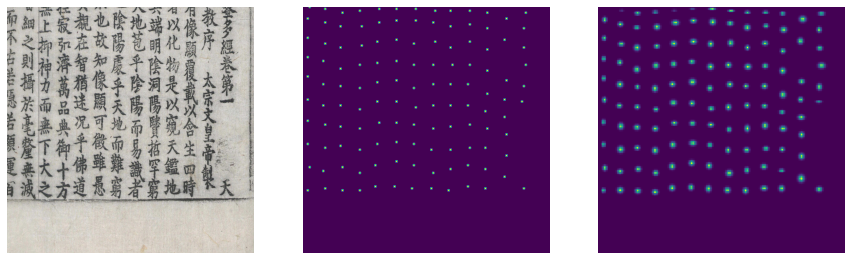

In [ ]:
category_n = 1
output_layer_n = category_n + 4
output_height, output_width = 128, 128

i = 0
h_split = annotation_list_train_w_split[i][2]
w_split = annotation_list_train_w_split[i][3]

max_crop_ratio_h = 1 / h_split
max_crop_ratio_w = 1 / w_split

crop_ratio = np.random.uniform(0.5, 1)
crop_ratio_h = max_crop_ratio_h * crop_ratio
crop_ratio_w = max_crop_ratio_w * crop_ratio

with Image.open(annotation_list_train_w_split[i][0]) as f:
    # Random crop
    pic_width, pic_height = f.size
    f = np.asarray(f.convert('RGB'), dtype = np.uint8)
    top_offset = np.random.randint(0, pic_height - int(crop_ratio_h * pic_height))
    left_offset = np.random.randint(0, pic_width - int(crop_ratio_w * pic_width))
    bottom_offset = top_offset + int(crop_ratio_h * pic_height)
    right_offset = left_offset + int(crop_ratio_w * pic_width)

    img = cv2.resize(f[top_offset:bottom_offset, left_offset:right_offset, :], (input_height, input_width))

output_layer = np.zeros((output_height, output_width, (output_layer_n + category_n)))

for annotation in annotation_list_train_w_split[i][1]:
    xc = (annotation[1] - left_offset) * (output_width / int(crop_ratio_w * pic_width))
    yc = (annotation[2] - top_offset) * (output_height / int(crop_ratio_h * pic_height))
    width = annotation[3] * (output_width / int(crop_ratio_w * pic_width))
    height = annotation[4] * (output_height / int(crop_ratio_h * pic_height))

    top = np.maximum(0, yc - height / 2)
    left = np.maximum(0, xc - width / 2)
    bottom = np.minimum(output_height, yc + height / 2)
    right = np.minimum(output_width, xc + width / 2)

    if top >= output_height or left >= output_width or bottom <= 0 or right <= 0:
        continue
    
    width = right - left
    height = bottom - top
    xc = (right + left) / 2
    yc = (top + bottom) / 2

    category = 0
    heatmap = (
        (np.exp(-(((np.arange(output_width) - xc) / (width / 10)) ** 2) / 2)).reshape(1, -1) * 
        (np.exp(-(((np.arange(output_height) - yc) / (height / 10)) ** 2)).reshape(-1, 1))
    )
    output_layer[:, :, category] = np.maximum(output_layer[:, :, category], heatmap[:, :])
    output_layer[int(yc // 1), int(xc // 1), category_n + category] = 1
    output_layer[int(yc // 1), int(xc // 1), 2 * category_n] = yc % 1
    output_layer[int(yc // 1), int(xc // 1), 2 * category_n + 1] = xc % 1
    output_layer[int(yc // 1), int(xc // 1), 2 * category_n + 2] = height / output_height
    output_layer[int(yc // 1), int(xc // 1), 2 * category_n + 3] = width / output_width

fig, axes = plt.subplots(1, 3, figsize = (15, 15))
axes[0].set_axis_off()
axes[0].imshow(img)
axes[1].set_axis_off()
axes[1].imshow(output_layer[:, :, 1])
axes[2].set_axis_off()
axes[2].imshow(output_layer[:, :, 0])
plt.show()

## Creating datagen and loss functions for model training

In [ ]:
category_n = 1
output_layer_n = category_n + 4
output_height, output_width = 128, 128

def datagen_centernet(filenames, batch_size):
    x, y = [], []

    count = 0

    while True:
        for i in range(len(filenames)):
            h_split = filenames[i][2]
            w_split = filenames[i][3]

            max_crop_ratio_h = 1 / h_split
            max_crop_ratio_w = 1 / w_split

            crop_ratio = np.random.uniform(0.5, 1)
            crop_ratio_h = max_crop_ratio_h * crop_ratio
            crop_ratio_w = max_crop_ratio_w * crop_ratio
      
            with Image.open(filenames[i][0]) as f:
                # Random cropping
                pic_width, pic_height = f.size
                f = np.asarray(f.convert('RGB'), dtype = np.uint8)

                top_offset = np.random.randint(0, pic_height - int(crop_ratio_h * pic_height))
                left_offset = np.random.randint(0, pic_width - int(crop_ratio_w * pic_width))
                bottom_offset = top_offset + int(crop_ratio_h * pic_height)
                right_offset = left_offset + int(crop_ratio_w * pic_width)

                f = cv2.resize(f[top_offset:bottom_offset, left_offset:right_offset, :], (input_height, input_width))

                x.append(f)      

            output_layer = np.zeros((output_height, output_width, (output_layer_n + category_n)))

            for annotation in filenames[i][1]:
                x_c = (annotation[1] - left_offset) * (output_width / int(crop_ratio_w * pic_width))
                y_c = (annotation[2] - top_offset) * (output_height / int(crop_ratio_h * pic_height))
                width = annotation[3] * (output_width / int(crop_ratio_w * pic_width))
                height = annotation[4] * (output_height / int(crop_ratio_h * pic_height))
                top = np.maximum(0, y_c - height / 2)
                left = np.maximum(0, x_c - width / 2)
                bottom = np.minimum(output_height, y_c + height / 2)
                right = np.minimum(output_width, x_c + width / 2)

                if top >= (output_height - 0.1) or left >= (output_width - 0.1) or bottom <= 0.1 or right <= 0.1:
                    continue

                width = right - left
                height = bottom - top
                x_c = (right + left) / 2
                y_c = (top + bottom) / 2


                category = 0
                heatmap = (
                    (np.exp(-(((np.arange(output_width) - x_c) / (width / 10)) ** 2) / 2)).reshape(1,-1) *
                    (np.exp(-(((np.arange(output_height) - y_c) / (height / 10)) ** 2) / 2)).reshape(-1,1)
                )
                output_layer[:, :, category] = np.maximum(output_layer[:, :, category], heatmap[:, :])
                output_layer[int(y_c // 1), int(x_c // 1), category_n + category] = 1
                output_layer[int(y_c // 1), int(x_c // 1), 2 * category_n] = y_c % 1
                output_layer[int(y_c // 1), int(x_c // 1), 2 * category_n + 1] = x_c % 1
                output_layer[int(y_c // 1), int(x_c // 1), 2 * category_n + 2] = height / output_height
                output_layer[int(y_c // 1), int(x_c // 1), 2 * category_n + 3] = width / output_width
      
            y.append(output_layer)  
    
            count += 1

            if count == batch_size:
                x = np.array(x, dtype = np.float32)
                y = np.array(y, dtype = np.float32)

                inputs = x / 255
                targets = y

                x, y = [], []
                count = 0
                
                yield inputs, targets

def all_loss(y_true, y_pred):
    mask = K.sign(y_true[..., 2 * category_n + 2])
    N = K.sum(mask)
    alpha, beta = 2., 4.

    heatmap_true_rate = K.flatten(y_true[..., :category_n])
    heatmap_true = K.flatten(y_true[..., category_n : (2 * category_n)])
    heatmap_pred = K.flatten(y_pred[..., :category_n])
    heatloss = -K.sum(heatmap_true*((1 - heatmap_pred) ** alpha) * K.log(heatmap_pred + 1e-6) + (1 - heatmap_true) * ((1 - heatmap_true_rate) ** beta) * (heatmap_pred ** alpha) * K.log(1 - heatmap_pred + 1e-6))
    offsetloss = K.sum(K.abs(y_true[..., 2 * category_n] - y_pred[..., category_n] * mask) + K.abs(y_true[..., 2 * category_n + 1] - y_pred[..., category_n + 1] * mask))
    sizeloss = K.sum(K.abs(y_true[..., 2 * category_n + 2] - y_pred[..., category_n + 2] * mask) + K.abs(y_true[..., 2 * category_n + 3] - y_pred[..., category_n + 3] * mask))

    all_loss = (heatloss + 1.0 * offsetloss + 5.0 * sizeloss) / N
    return all_loss

def size_loss(y_true, y_pred):
    mask = K.sign(y_true[..., 2 * category_n + 2])
    N = K.sum(mask)
    sizeloss = K.sum(K.abs(y_true[..., 2 * category_n + 2] - y_pred[..., category_n + 2] * mask) + K.abs(y_true[..., 2 * category_n + 3] - y_pred[..., category_n + 3] * mask))
    return (5 * sizeloss) / N

def offset_loss(y_true, y_pred):
    mask = K.sign(y_true[..., 2 * category_n + 2])
    N = K.sum(mask)
    offsetloss = K.sum(K.abs(y_true[..., 2 * category_n] - y_pred[..., category_n] * mask) + K.abs(y_true[..., 2 * category_n + 1] - y_pred[..., category_n + 1] * mask))
    return (offsetloss) / N

def heatmap_loss(y_true, y_pred):
    mask = K.sign(y_true[..., 2 * category_n + 2])
    N = K.sum(mask)
    alpha, beta = 2., 4.

    heatmap_true_rate = K.flatten(y_true[..., :category_n])
    heatmap_true = K.flatten(y_true[..., category_n : (2 * category_n)])
    heatmap_pred = K.flatten(y_pred[..., :category_n])
    heatloss = -K.sum(heatmap_true * ((1 - heatmap_pred) ** alpha) * K.log(heatmap_pred + 1e-6) + (1 - heatmap_true) * ((1 - heatmap_true_rate) ** beta) * (heatmap_pred ** alpha) * K.log(1 - heatmap_pred + 1e-6))
    return heatloss / N

def model_fit_centernet(model, train_list, cv_list, n_epoch, batch_size = 32):
    # hist = model.fit_generator(
    #     Datagen_centernet(train_list,batch_size),
    #     steps_per_epoch = len(train_list) // batch_size,
    #     epochs = n_epoch,
    #     validation_data=Datagen_centernet(cv_list,batch_size),
    #     validation_steps = len(cv_list) // batch_size,
    #     callbacks = [lr_schedule],#early_stopping, reduce_lr, model_checkpoint],
    #     shuffle = True,
    #     verbose = 1
    # )

    hist = model.fit(
        datagen_centernet(train_list, batch_size),
        epochs = n_epoch,
        steps_per_epoch = len(train_list) // batch_size,
        validation_data = datagen_centernet(cv_list, batch_size),
        validation_steps = len(cv_list) // batch_size,
        callbacks = [lr_schedule, model_checkpoint],
        verbose = 1
    )
    return hist

In [ ]:
K.clear_session()

model = create_model(input_shape = (input_height, input_width, 3), size_detection_mode = False)

def lrs(epoch):
    lr = 0.001
    if epoch >= 20: lr = 0.0002
    return lr

lr_schedule = LearningRateScheduler(lrs)

model_checkpoint = ModelCheckpoint(
    'final_weights_step2.hdf5', 
    monitor = 'val_loss',
    verbose = 1, save_best_only = True, save_weights_only = True, 
    period  = 1
)

model.load_weights(
    '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step1.hdf5',
    by_name = True,
    skip_mismatch = True
)

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

## Start training

In [ ]:
train_list, cv_list = train_test_split(annotation_list_train_w_split, random_state = 111, test_size = 0.2)

def train_detection_model():
    learning_rate = 0.001
    n_epoch = 30
    batch_size = 32

    model.compile(
        loss = all_loss,
        optimizer = Adam(learning_rate = learning_rate),
        metrics = [heatmap_loss, size_loss, offset_loss]
    )

    hist = model_fit_centernet(model, train_list, cv_list, n_epoch, batch_size)

    model.save_weights('final_weights_step2.h5')

# train_detection_model()

In [ ]:
# !cp 'final_weights_step2.hdf5' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step2.hdf5'

!cp 'final_weights_step2.h5' '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step2.h5'

In [ ]:
# Load model 

model.load_weights(
    '/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step2.h5',
)

Check a result of heatmap, with validation data

In [ ]:
pred_in_h = 512
pred_in_w = 512

pred_out_h = int(pred_in_h / 4)
pred_out_w = int(pred_in_w / 4)

for i in np.arange(0, 1):
    img = np.asarray(Image.open(cv_list[i][0]).resize((pred_in_w, pred_in_h)).convert('RGB'))
    predict = model.predict((img.reshape(1, pred_in_h, pred_in_w, 3)) / 255).reshape(pred_out_h, pred_out_w, (category_n + 4))

    heatmap = predict[:, :, 0]

    fig, axes = plt.subplots(1, 2, figsize = (15, 15))
    axes[0].set_axis_off()
    axes[0].imshow(img)
    axes[1].set_axis_off()
    axes[1].imshow(heatmap)
    plt.show()

NameError: ignored

Now convert these outputs into bounding boxes, using Non Maximum Suppression.

In [ ]:
def NMS_all(predicts, category_n, score_thresh, iou_thresh):
    yc = predicts[..., category_n] + np.arange(pred_out_h).reshape(-1, 1)
    xc = predicts[..., category_n + 1] + np.arange(pred_out_w).reshape(1, -1)

    height = predicts[..., category_n + 2] * pred_out_h
    width = predicts[..., category_n + 3] * pred_out_w

    count = 0

    for category in range(category_n):
        predict = predicts[..., category]
        mask = (predict > score_thresh)

        if mask.all == False:
            continue
        
        box_and_score = NMS(
            predict[mask], 
            yc[mask], xc[mask], 
            height[mask], width[mask], iou_thresh)

        box_and_score = np.insert(box_and_score, 0, category, axis = 1)

        box_and_score_all = box_and_score if count == 0 else np.concatenate((box_and_score_all, box_and_score), axis = 0)

        count += 1

    score_sort = np.argsort(box_and_score_all[:, 1])[::-1]

    box_and_score_all = box_and_score_all[score_sort]

    _, unique_idx = np.unique(box_and_score_all[:, 2], return_index = True)

    return box_and_score_all[sorted(unique_idx)]

def NMS(score, yc, xc, height, width, iou_thresh, merge_mode = False):
    if merge_mode:
        score = score
        top, left = yc, xc
        bottom, right = height, width
    else:
        score = score.reshape(-1)
        yc = yc.reshape(-1)
        xc = xc.reshape(-1)
        height = height.reshape(-1)
        width = width.reshape(-1)
        size = height * width
    
        top = yc - height / 2
        left = xc - width / 2
        bottom = yc + height / 2
        right = xc + width / 2

        inside_pic = (top > 0) * (left > 0) * (bottom < pred_out_h) * (right < pred_out_w)
        outside_pic = len(inside_pic) - np.sum(inside_pic)

        normal_size = (size < (np.mean(size) * 10)) * (size > (np.mean(size) / 10))

        score, top, left, bottom, right = score[inside_pic * normal_size], top[inside_pic * normal_size], left[inside_pic * normal_size], bottom[inside_pic * normal_size], right[inside_pic * normal_size]
    
    # Sorting
    score_sort = np.argsort(score)[::-1]
    score, top, left, bottom, right = score[score_sort], top[score_sort], left[score_sort], bottom[score_sort], right[score_sort]

    area = ((bottom - top) * (right - left))

    boxes = np.concatenate((score.reshape(-1, 1), top.reshape(-1, 1), left.reshape(-1, 1), bottom.reshape(-1, 1), right.reshape(-1, 1)), axis = 1)

    box_idx = np.arange(len(top))
    alive_box = []

    while len(box_idx) > 0:
        alive_box.append(box_idx[0])

        y1, x1, y2, x2 = np.maximum(top[0], top), np.maximum(left[0], left), np.minimum(bottom[0], bottom), np.minimum(right[0], right)

        cross_h = np.maximum(0, y2 - y1)
        cross_w = np.maximum(0, x2 - x1)

        still_alive = (((cross_h * cross_w) / area[0]) < iou_thresh)

        if np.sum(still_alive) == len(box_idx):
            print('Error')
            print(np.max((cross_h * cross_w)), area[0])
        
        top, left, bottom, right, area, box_idx = top[still_alive], left[still_alive], bottom[still_alive], right[still_alive], area[still_alive], box_idx[still_alive]

    return boxes[alive_box]

def draw_rectangle(box_and_score, img, color):
    number_of_rect = np.minimum(500, len(box_and_score))

    for i in reversed(list(range(number_of_rect))):
        top, left, bottom, right = box_and_score[i, :]

        top, left, bottom, right = np.floor(top + 0.5).astype('int32'), np.floor(left + 0.5).astype('int32'), np.floor(bottom + 0.5).astype('int32'), np.floor(right + 0.5).astype('int32')

        draw = ImageDraw.Draw(img)

        thickness = 4

        if color == 'red':
            rect_color = (255, 0, 0)
        elif color == 'blue':
            rect_color = (0, 0, 255)
        else:
            rect_color = (0, 0, 0)
        
        if i == 0:
            thickness = 4
        
        for j in range(2 * thickness):
            draw.rectangle([left + j, top + j, right - j, bottom - j], outline = rect_color)
        
    
    del draw
    return img

def check_iou_score(true_boxes, detected_boxes, iou_thresh):
    iou_all = []
    
    for detected_box in detected_boxes:
        y1 = np.maximum(detected_box[0], true_boxes[:, 0])
        x1 = np.maximum(detected_box[1], true_boxes[:, 1])
        y2 = np.minimum(detected_box[2], true_boxes[:, 2])
        x2 = np.minimum(detected_box[3], true_boxes[:, 3])

        cross_section = np.maximum(0, y2 - y1) * np.maximum(0, x2 - x1)

        all_area = (detected_box[2] - detected_box[0]) * (detected_box[3] - detected_box[1]) + (true_boxes[:, 2] - true_boxes[:, 0]) * (true_boxes[:, 3] - true_boxes[:, 1])

        iou = np.max(cross_section / (all_area - cross_section))

        iou_all.append(iou)

    score = 2 * np.sum(iou_all) / (len(detected_boxes) + len(true_boxes))
    print('Score: {}'.format(np.round(score, 3)))

    return score

Score: 0.367


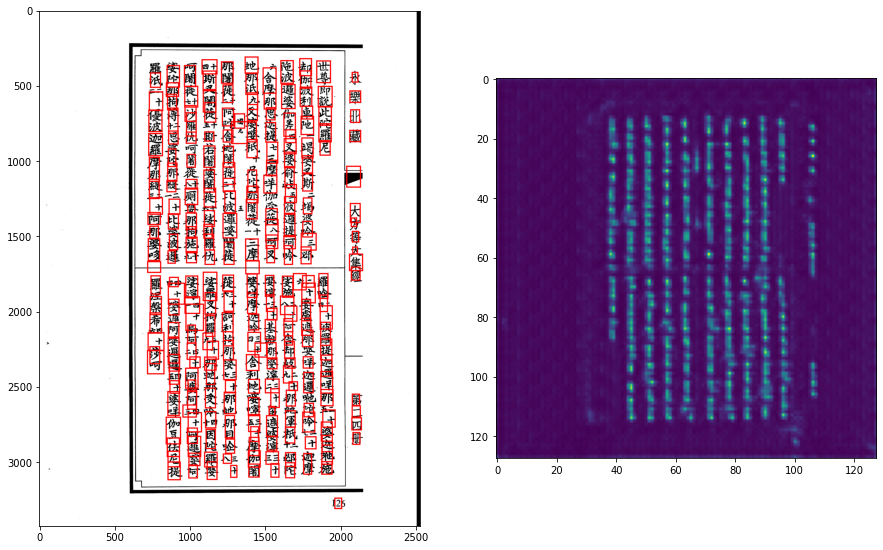

Score: 0.389


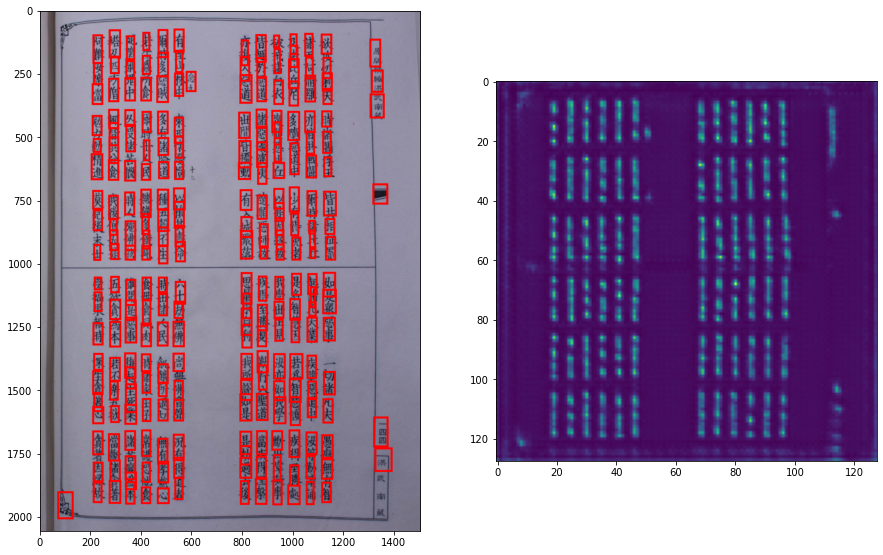

Score: 0.279


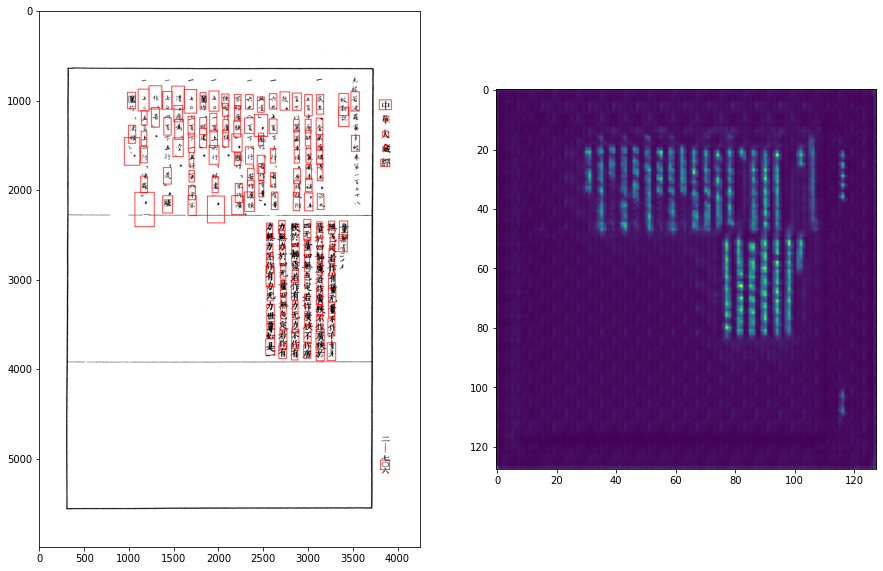

Score: 0.33


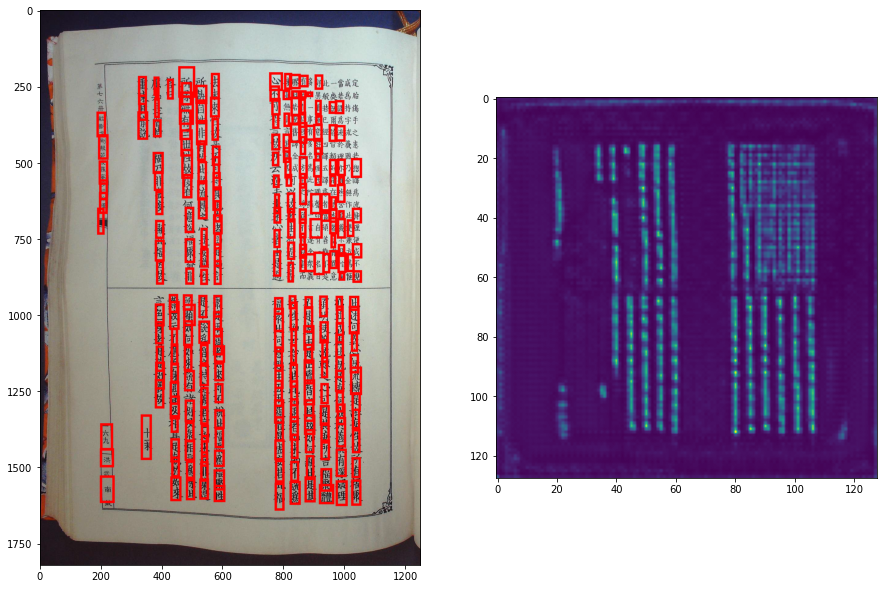

Score: 0.772


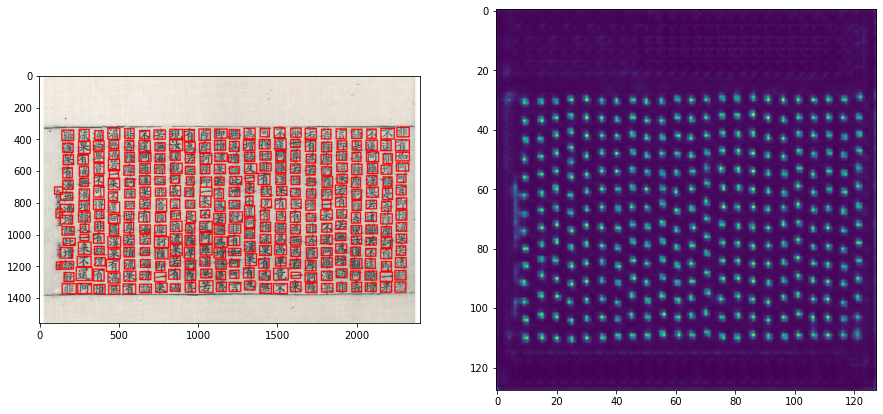

In [ ]:
for i in np.arange(0, 5):
    img = Image.open(cv_list[i][0]).convert('RGB')

    width, height = img.size

    predict = model.predict((np.asarray(img.resize((pred_in_w, pred_in_h))).reshape(1, pred_in_h, pred_in_w, 3)) / 255).reshape(pred_out_h, pred_out_w, (category_n + 4))

    box_and_score = NMS_all(predict, category_n, score_thresh = 0.3, iou_thresh = 0.4)

    if len(box_and_score) == 0:
        continue
    
    true_boxes = cv_list[i][1][:, 1:]

    top = true_boxes[:, 1:2] - true_boxes[:, 3:4] / 2
    left = true_boxes[:, 0:1] - true_boxes[:, 2:3] / 2
    bottom = top + true_boxes[:, 3:4]
    right = left + true_boxes[:, 2:3]

    true_boxes = np.concatenate((top, left, bottom, right), axis = 1)

    heatmap = predict[:, :, 0]

    print_w, print_h = img.size

    box_and_score = box_and_score * [1, 1, print_h / pred_out_h, print_w / pred_out_w, print_h / pred_out_h, print_w / pred_out_w]

    check_iou_score(true_boxes, box_and_score[:, 2:], iou_thresh = 0.5)

    img = draw_rectangle(box_and_score[:, 2:], img, 'red')
    # img = draw_rectangle(true_boxes, img, 'blue')

    fig, axes = plt.subplots(1, 2, figsize = (15, 15))

    axes[0].imshow(img)
    axes[1].imshow(heatmap)

    plt.show()

## Improvement by splitting image into parts

Dễ nhận thấy là nếu predict trên ảnh gốc sẽ xuất hiện các bounding box gộp chung nhiều chữ với nhau (như đã nói ở trên, chữ nhỏ!)

Thay vào đó, ta split ảnh ban đầu ra nhiều ảnh nhỏ bằng tỉ lệ ở model1, rồi chạy CenterNet trên các ảnh này. Cuối cùng, dùng NMS tính toán trên kết quả.

In [ ]:
def split_and_detect(model, img, height_split_recommended, width_split_recommended, score_thresh = 0.3, iou_thresh = 0.4):
    width, height = img.size
    pred_in_w, pred_in_h = 512, 512
    pred_out_w, pred_out_h = 128, 128

    category_n = 1
    maxlap = 0.5

    height_split = int(-(-height_split_recommended // 1) + 1)
    width_split = int(-(-width_split_recommended // 1) + 1)
    
    height_lap = (height_split - height_split_recommended) / (height_split - 1)
    height_lap = np.minimum(maxlap, height_lap)
    width_lap = (width_split - width_split_recommended) / (width_split - 1)
    width_lap = np.minimum(maxlap, width_lap)

    if height > width:
        crop_size = int((height) / (height_split - (height_split - 1) * height_lap))
        
        if crop_size >= width:
            crop_size = width
            stride = int((crop_size * height_split - height) / (height_split - 1))
            
            top_list = [i * stride for i in range(height_split - 1)] + [height - crop_size]
            left_list = [0]
        else:
            stride = int((crop_size * height_split - height) / (height_split - 1))
            top_list = [i * stride for i in range(height_split - 1)] + [height - crop_size]
            
            width_split = -(-width // crop_size)
            stride = int((crop_size * width_split - width) / (width_split - 1))
            left_list = [i * stride for i in range(width_split - 1)] + [width - crop_size]
    else:
        crop_size = int((width) / (width_split - (width_split - 1) * width_lap))

        if crop_size >= height:
            crop_size = height
            stride = int((crop_size * width_split - width) / (width_split - 1))
            left_list = [i * stride for i in range(width_split - 1)] + [width - crop_size]
            top_list = [0]
        else:
            stride = int((crop_size * width_split - width) / (width_split - 1))
            left_list = [i * stride for i in range(width_split - 1)] + [width - crop_size]
            height_split = -(-height // crop_size)
            stride = int((crop_size * height_split - height) / (height_split - 1))
            top_list = [i * stride for i in range(height_split - 1)] + [height - crop_size]

    count = 0

    for top_offset in top_list:
        for left_offset in left_list:
            img_crop = img.crop((left_offset, top_offset, left_offset + crop_size, top_offset + crop_size))

            predict = model.predict((np.asarray(img_crop.resize((pred_in_w, pred_in_h))).reshape(1, pred_in_h, pred_in_w, 3)) / 255).reshape(pred_out_h, pred_out_w, (category_n + 4))

            box_and_score = NMS_all(predict, category_n, score_thresh, iou_thresh)

            if len(box_and_score) == 0:
                continue
            
            box_and_score = box_and_score * [1, 1, crop_size / pred_out_h, crop_size / pred_out_w, crop_size / pred_out_h, crop_size / pred_out_w] + np.array([0, 0, top_offset, left_offset, top_offset, left_offset])
            
            box_and_score_all = box_and_score if count == 0 else np.concatenate((box_and_score_all, box_and_score), axis = 0)

            count += 1

    if count == 0:
        box_and_score_all = []
    else:
        score = box_and_score_all[:, 1]
        yc = (box_and_score_all[:, 2] + box_and_score_all[:, 4]) / 2
        xc = (box_and_score_all[:, 3] + box_and_score_all[:, 5]) / 2

        height = -box_and_score_all[:, 2] + box_and_score_all[:, 4]
        width = -box_and_score_all[:, 3] + box_and_score_all[:, 5]

        box_and_score_all = NMS(
            box_and_score_all[:, 1], box_and_score_all[:, 2], 
            box_and_score_all[:, 3], box_and_score_all[:, 4],
            box_and_score_all[:, 5], iou_thresh = 0.5, merge_mode = True)
    
    return box_and_score_all 

Score: 0.763


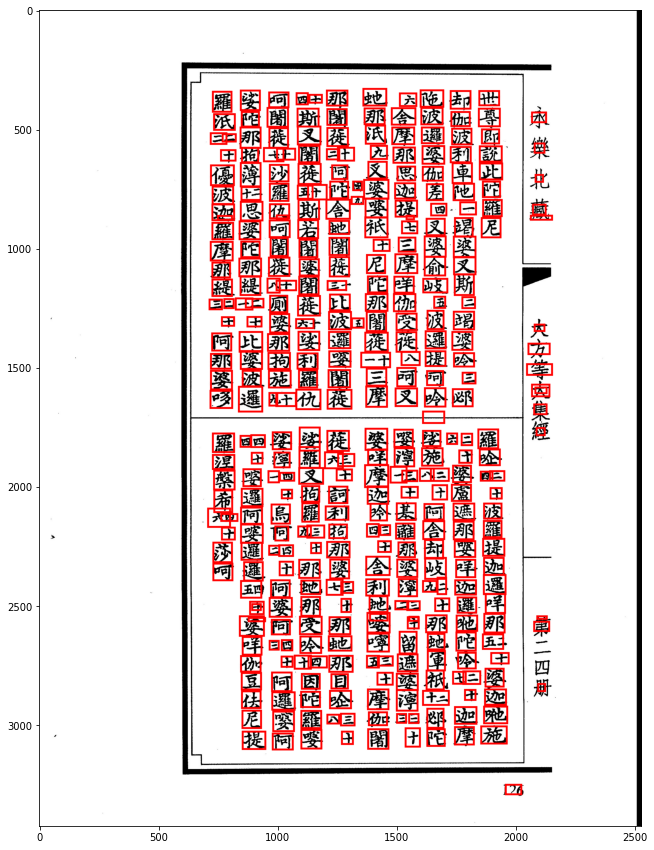

Score: 0.786


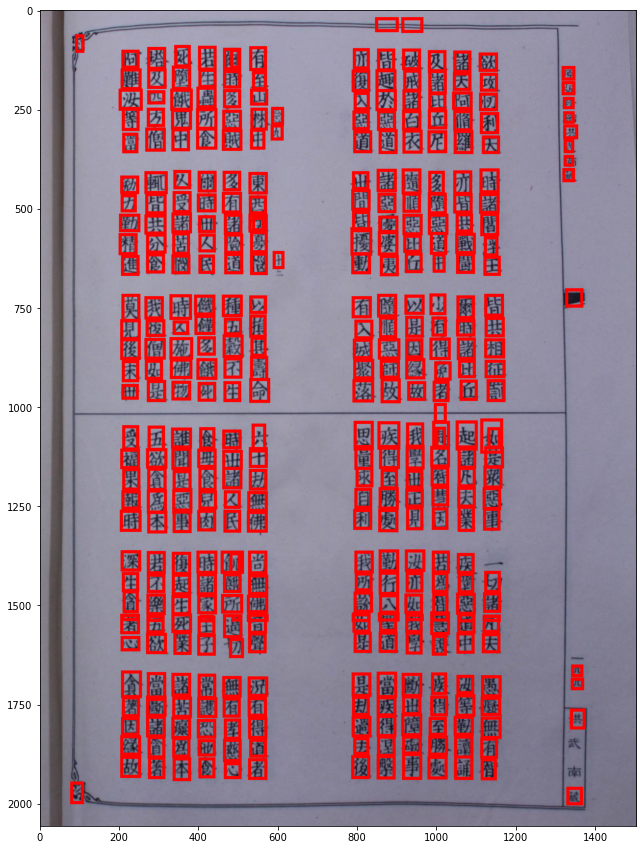

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


Score: 0.702


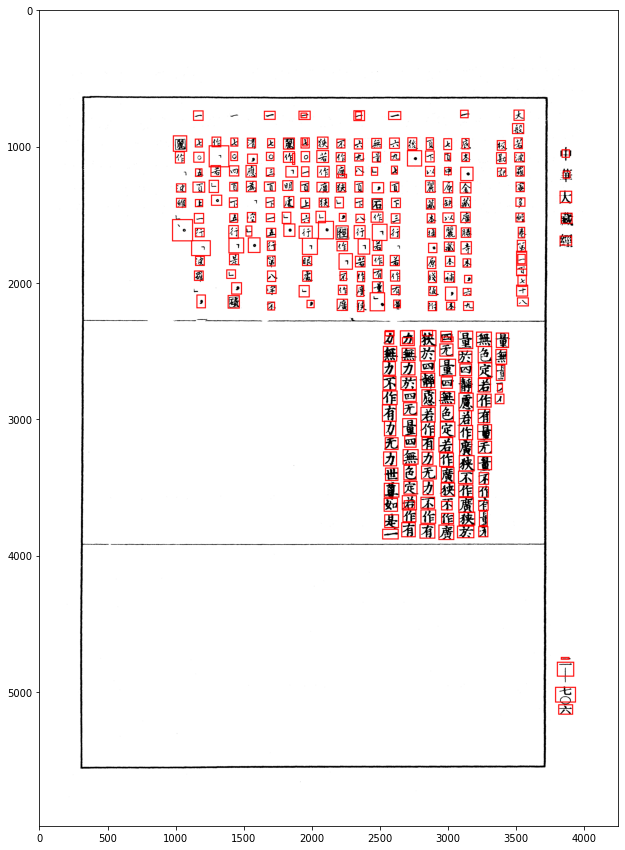

Score: 0.67


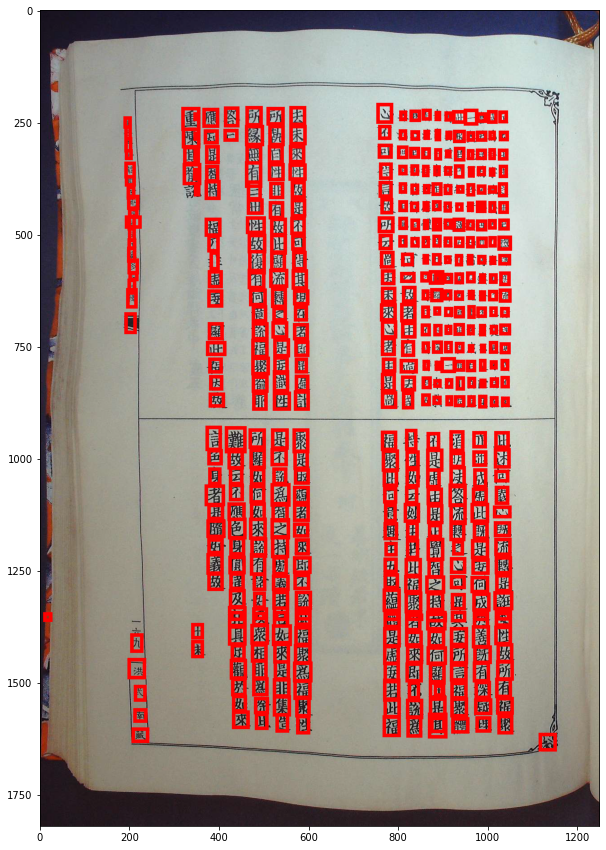

Score: 0.772


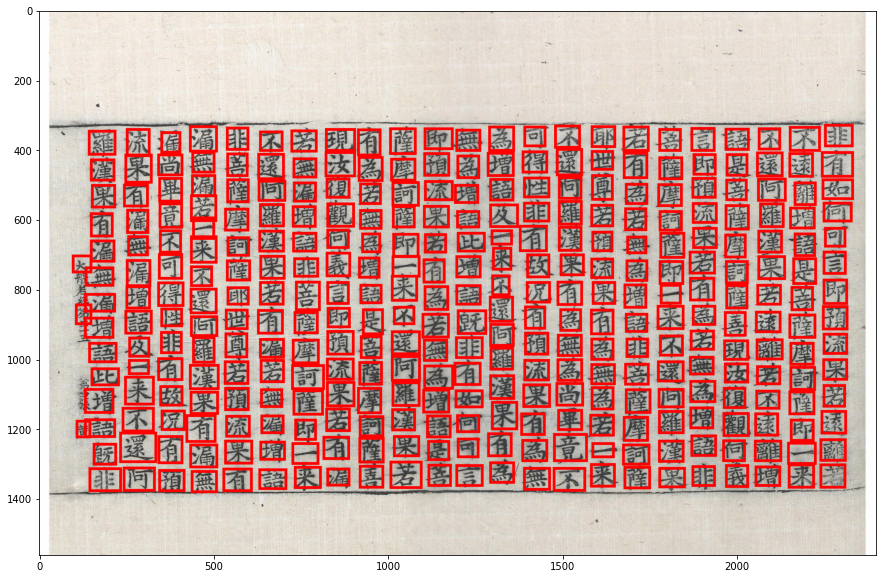

Score: 0.783


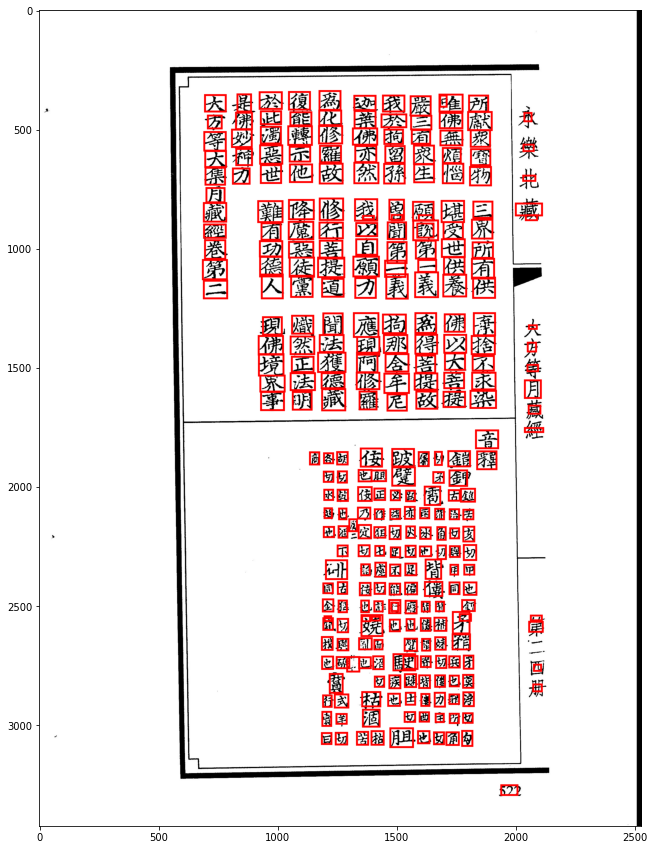

Score: 0.791


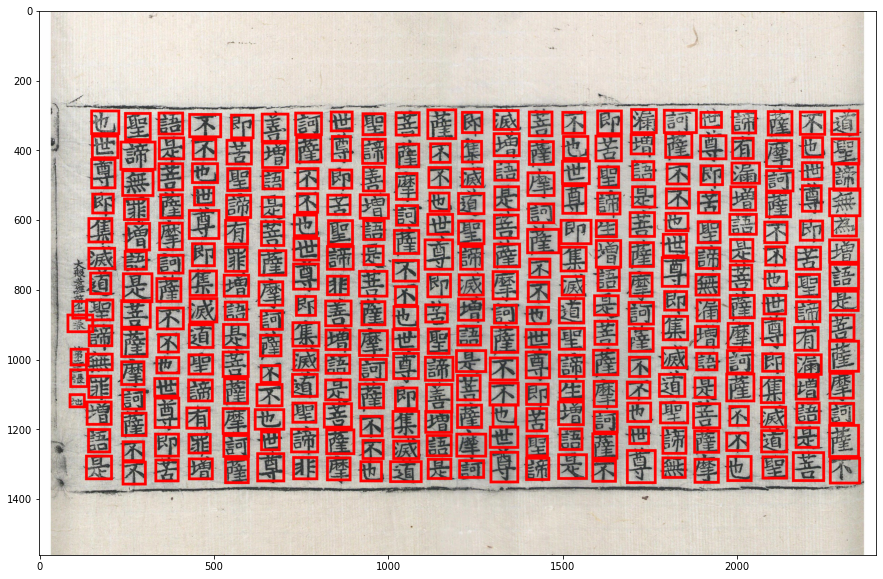

Score: 0.765


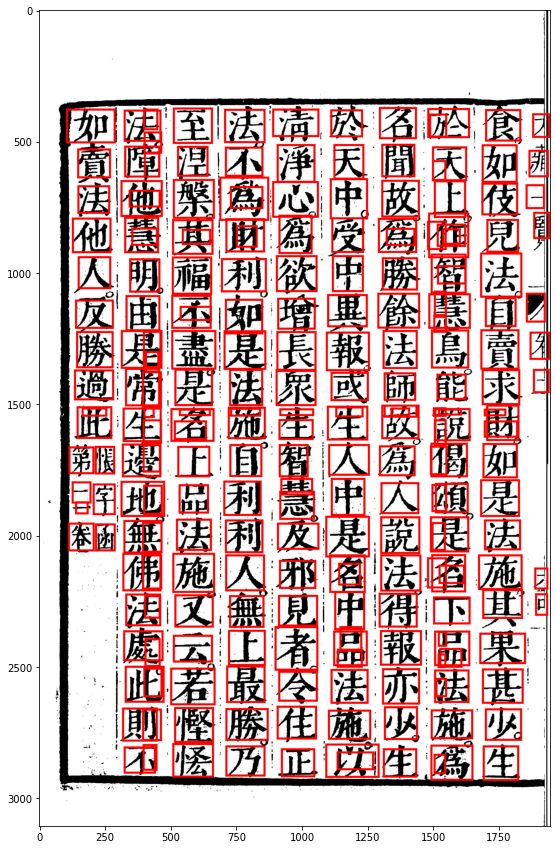

Score: 0.743


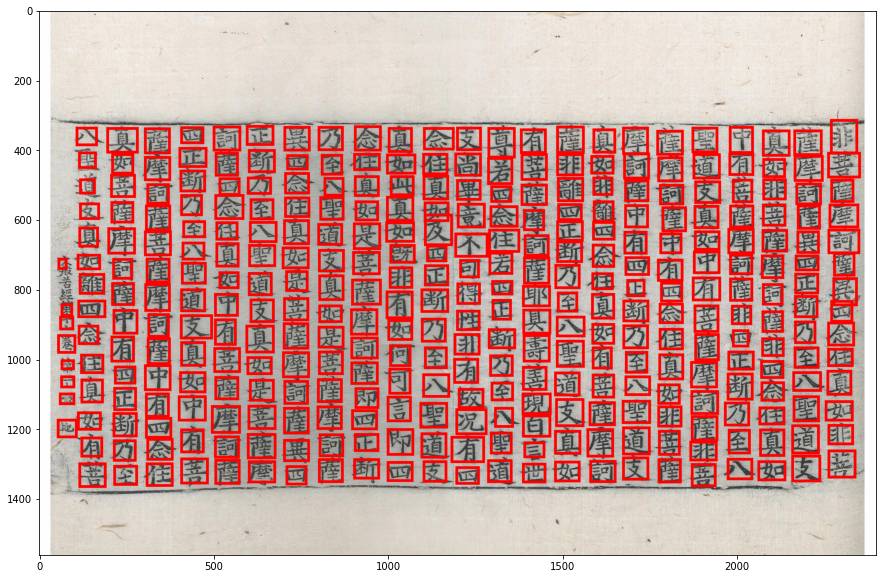

Score: 0.802


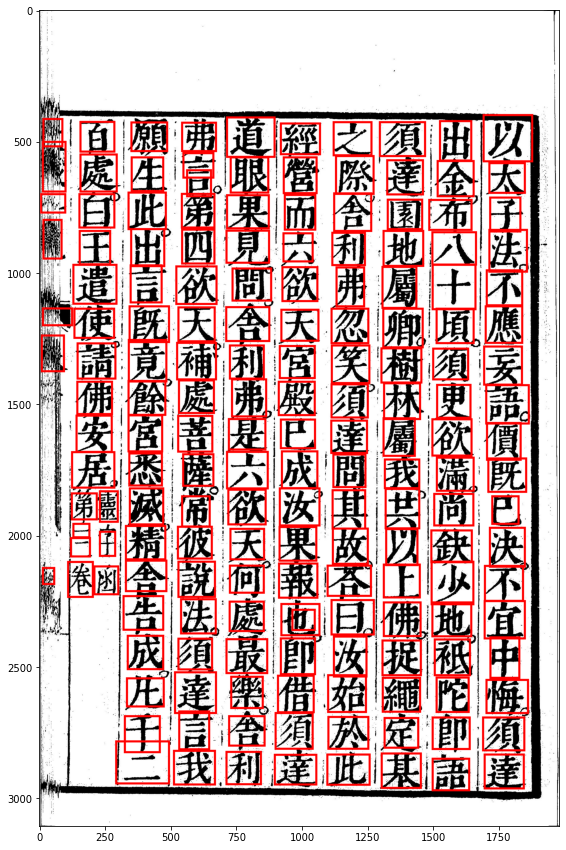

Average score: 0.7575924880660949


In [ ]:
# Testing above.

all_iou_score = []
for i in np.arange(0, 10):
    img = Image.open(cv_list[i][0]).convert('RGB')

    pic_width, pic_height = img.size

    if pic_height > pic_width:
        box_and_score_all = split_and_detect(model, img, cv_list[i][2], cv_list[i][3], score_thresh = 0.3, iou_thresh = 0.4)

    else:
        # Since splitting behaves badly on images look-like training data,
        # aka width > height, we'll only predict these images using non-splitted method.

        predict = model.predict((np.asarray(img.resize((pred_in_w, pred_in_h))).reshape(1, pred_in_h, pred_in_w, 3)) / 255).reshape(pred_out_h, pred_out_w, (category_n + 4))

        box_and_score_all = NMS_all(predict, category_n, score_thresh = 0.3, iou_thresh = 0.4)

    if len(box_and_score_all) == 0:
        print('No box found')
        continue
    
    true_boxes = cv_list[i][1][:, 1:]
    top = true_boxes[:, 1:2] - true_boxes[:, 3:4] / 2
    left = true_boxes[:, 0:1] - true_boxes[:, 2:3] / 2
    bottom = top + true_boxes[:, 3:4]
    right = left + true_boxes[:, 2:3]
    
    true_boxes = np.concatenate((top, left, bottom, right), axis = 1)

    print_w, print_h = img.size
    
    if pic_width > pic_height:        
        box_and_score_all = box_and_score_all * [1, 1, print_h / pred_out_h, print_w / pred_out_w, print_h / pred_out_h, print_w / pred_out_w]

        iou_score = check_iou_score(true_boxes, box_and_score_all[:, 2:], iou_thresh = 0.5)
    else:
        iou_score = check_iou_score(true_boxes, box_and_score_all[:, 1:], iou_thresh = 0.5)

    all_iou_score.append(iou_score)

    # Draw red rectangle box
    if (pic_width < pic_height):
        img = draw_rectangle(box_and_score_all[:, 1:], img, 'red')
        # fig, axes = plt.subplots(1, 1, figsize = (15, 15))
        # axes.imshow(img)
    else:
        img = draw_rectangle(box_and_score_all[:, 2:], img, 'red')
    
    
    fig, axes = plt.subplots(1, 1, figsize = (15, 15))
    axes.imshow(img)
    plt.show()

print('Average score:', np.mean(all_iou_score))


Rõ ràng điểm cao hơn nhiều ^^

# Test final models
Đến bước này mình sẽ không làm bước train classification model theo notebook, mà dùng model đã train ở notebook `train_recognition.ipynb` cho đỡ tốn thời gian.

In [ ]:
K.clear_session()

n_category = 1
output_layer_n = n_category + 4

train_labels = 1188

pred_in_h = 512
pred_in_w = 512

pred_out_h = int(pred_in_h / 4)
pred_out_w = int(pred_in_w / 4)


model_1 = create_model(
    input_shape = (512, 512, 3),
    size_detection_mode = True    
)

model_1.load_weights('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step1.hdf5')

model_2 = create_model(
    input_shape = (512, 512, 3),
    size_detection_mode = False
)

model_2.load_weights('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/second_approach/final_weights_step2.h5')


model_3 = load_model('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/model_chu_nom.h5')
model_3.summary()

yy_ = np.load('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/yy_.npy')
lb = LabelEncoder()
y_integer = lb.fit_transform(yy_)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 300, 300, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 300, 300, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 298, 298, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 298, 298, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 149, 149, 32)      25632 

In [ ]:
def pipeline(image_path, print_img = False):
    base_detect_num_h, base_detect_num_w = 25, 25

    category_n = 1
    output_layer_n = category_n + 4

    # Model1: determine how to split image
    if print_img:
        print('Model 1')

    with Image.open(image_path).convert('RGB') as img_handle:
        img_handle = Image.open(image_path).convert('RGB')

        img_w, img_h = img_handle.size

        aspect_ratio_pic = img_h / img_w

        img = np.asarray(img_handle.resize((512, 512)).convert('RGB'))
        predicted_size = model_1.predict(img.reshape(1, 512, 512, 3) / 255)


        # detect_num_h = aspect_ratio_pic_all[i] * np.exp(-predicted_size / 2)
        # detect_num_w = detect_num_h / aspect_ratio_pic_all[i]
        detect_num_h = aspect_ratio_pic * np.exp(-predicted_size / 2)
        detect_num_w = detect_num_h / aspect_ratio_pic
        h_split_recommend = np.maximum(1, detect_num_h / base_detect_num_h)
        w_split_recommend = np.maximum(1, detect_num_w / base_detect_num_w)

        if print_img:
            print('Recommended split_h: {}, split_h: {}'.format(h_split_recommend, w_split_recommend))

    # Model2: detection with CenterNet
    if print_img:
        print('Model 2')

    with Image.open(image_path).convert('RGB') as img:
        box_and_score_all = split_and_detect(
            model_2,
            img,
            h_split_recommend, w_split_recommend,
            score_thresh = 0.3, iou_thresh = 0.4)

        if print_img:
            print('Found {} boxes'.format(len(box_and_score_all)))

        print_w, print_h = img.size

        if (len(box_and_score_all) > 0) and print_img: 
            plt.figure(figsize = (30, 30))
            img = draw_rectangle(box_and_score_all[:, 1:], img, 'red')
            plt.imshow(img)
            plt.show()

    # Model3: classification
    print('Model 3:')

    ocred_data = []

    img = cv2.imread(image_path)
    im_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, im_th = cv2.threshold(im_grey, 130, 255, cv2.THRESH_BINARY_INV)

    if (len(box_and_score_all) > 0):
        for box in tqdm(box_and_score_all[:,1:]):
            top, left, bottom, right = box

            roi = im_th[int(top):int(bottom), int(left):int(right)]
            roi = cv2.resize(roi, (300, 300))

            ret, th1 = cv2.threshold(roi, 155, 255, cv2.THRESH_BINARY)

            ProcessImage = th1.reshape(1, 300, 300, 1)
            y_pred = model_3.predict(ProcessImage)
            y_true = np.argmax(y_pred, axis=1)
            ChuNom = lb.inverse_transform(y_true)
            
            code = str(ChuNom[0])

            current_box = (code, top, left, bottom, right)

            ocred_data.append(current_box)
    
    return ocred_data

Model 1
Recommended split_h: [[2.2016563]], split_h: [[1.1008282]]
Model 2
Found 381 boxes


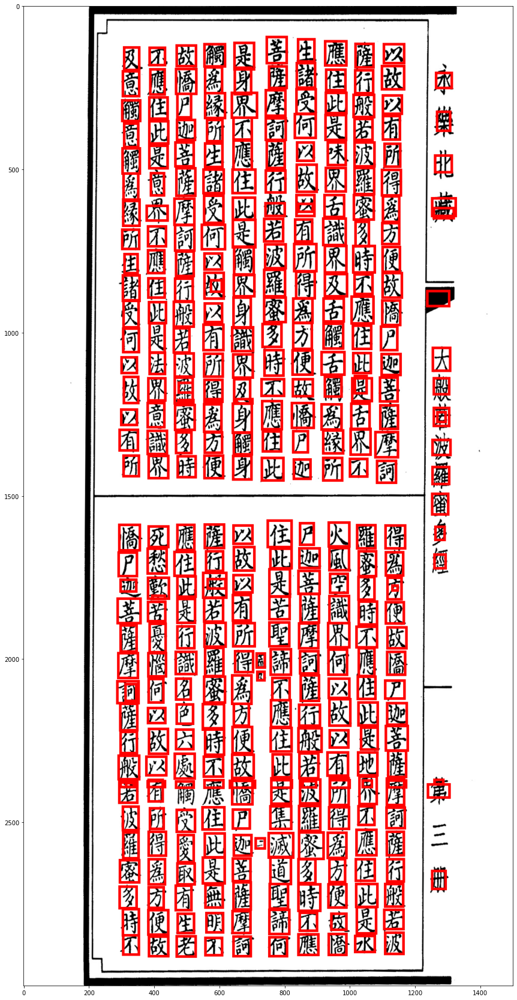

Model 3:


100%|██████████| 381/381 [00:36<00:00, 10.39it/s]

[('羅', 1961.7123138159513, 553.3253766596317, 2055.1679503172636, 616.0803414881229), ('受', 576.7241824418306, 549.5004602707922, 667.2770965844393, 616.1053248681128), ('般', 2685.4796142317355, 1105.4668597877026, 2761.208996269852, 1167.1365670859814), ('従', 1296.4301484636962, 915.3700531460345, 1373.178483825177, 982.6515139080584), ('訶', 1972.498576529324, 844.2354639060795, 2046.9273375347257, 906.8076093681157), ('殊', 414.1008040867746, 929.1185030713677, 490.2284047566354, 991.067517735064), ('泫', 409.4774678349495, 741.9678716920316, 498.67547303438187, 804.4663100503385), ('住', 1299.2350677028298, 729.8344071954489, 1367.3284510150552, 792.5885137170553), ('應', 404.70292177051306, 639.5500956103206, 503.9028128609061, 702.9347715899348), ('天', 1298.1903704814613, 823.220469430089, 1370.0956377200782, 875.475587323308), ('菩', 1726.3357780873775, 839.4130946137011, 1803.3731125295162, 910.9735370613635), ('方', 2608.6483497172594, 934.3888364732265, 2685.7742685824633, 988.89139

In [ ]:
ans = pipeline('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/data_real/img/122.jpg', print_img = True)

print(ans)

In [ ]:
# Load the font to write

fontsize = 50
font = ImageFont.truetype(FONT_PATH, fontsize, encoding = 'utf-8')

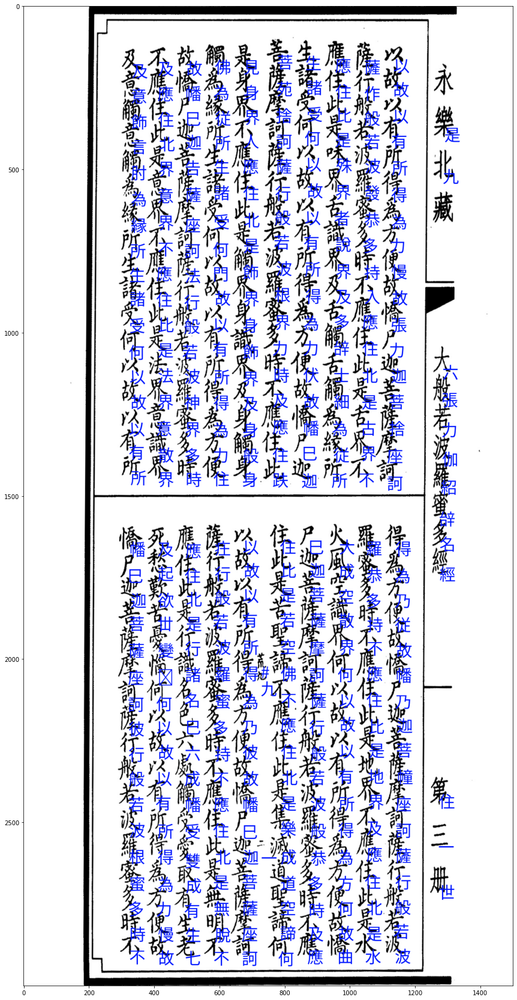

In [ ]:
# Draw on image to visualise.
with Image.open('/content/drive/MyDrive/Colab Notebooks/do_an_chu_Nom/data_real/img/122.jpg').convert('RGB') as img:
    char_draw = ImageDraw.Draw(img)

    for o in ans:
        char, top, left, bottom, right = o
        x = int((left + right) // 2)
        y = int((top + bottom) // 2)
        char_draw.text((x, y), char, fill = (0, 22, 255, 0), font = font)
    
    plt.figure(figsize = (30, 30))
    plt.imshow(img)
    plt.show()

Kết quả khá đẹp ^^

12:30AM, 18/12/2021.

Fin